In [1]:
using Plots
using Random
using LaTeXStrings
using Statistics
using DSP

$$H=-J\sum_{\langle i,j\rangle}\sigma_i\sigma_j$$
$$E_i=-J\sigma_i\sum_{j}\sigma_j$$

In [2]:
function ising(N,T,mcSteps,eqSteps)
    nt=length(T)
    E, M, C, X = zeros(nt), zeros(nt), zeros(nt), zeros(nt)
    n1, n2 = 1.0 / (mcSteps * N * N), 1.0 / (mcSteps * mcSteps * N * N)
    xs=range(0,N-1);
    config1 = initialstate(N)
    DataT=Dict()
    ET=zeros(mcSteps,nt)
    MT=zeros(mcSteps,nt)
    
    for tt in 1:nt
        Ene_arr=zeros(mcSteps)
        Mag_arr=zeros(mcSteps)
        Data=zeros(N,N,mcSteps)
        Data[:,:,1]=config1
        config=config1
        E1 = M1 = E2 = M2 = 0
        β = 1.0 / T[tt] ###β
    
        for i in 1:eqSteps   # equilibrate
            config= mcmove(config, β)  # Monte Carlo moves
        end
    
        for i in 1:mcSteps
            config=mcmove(config, β)
            Ene = calcEnergy(config)   # calculate the energy
            Mag = calcMag(config)      # calculate the magnetisation
            Ene_arr[i]=Ene
            Mag_arr[i]=Mag
            
            #E1 += Ene
            #M1 += Mag
            #M2 += Mag * Mag
            #E2 += Ene * Ene
            if i<mcSteps
                Data[:,:,i+1]=config
            end
        end
        DataT[tt]=Data
        ###Vector d estados en cada Temperatura
        ET[:,tt]=Ene_arr ##vector Energia en una temp
        MT[:,tt]=Mag_arr
        E1=sum(Ene_arr)
        M1=sum(Mag_arr)
        E2=sum(Ene_arr.^2)
        M2=sum(Mag_arr.^2)
        
        
        E[tt] = n1 * E1 ##Energia promedio en una temp
        M[tt] = n1 * M1 
        C[tt] = (n1 * E2 - n2 * E1^2) * β^2
        X[tt] = (n1 * M2 - n2 * M1^2) * β
    end
    return E,M,C,X,DataT,xs,ET,MT
end

ising (generic function with 1 method)

In [3]:

function initialstate(N)###Initialize spin
    state = 2 * rand(0:2-1, N, N) .- 1
    return state
end

function mcmove(config, β)
    C1=copy(config)
    N=size(config,1)
    for i in 1:N^2#N^2
        a = rand(1:N)
        b = rand(1:N)
        σ = config[a, b]
        nb = config[mod1(a+1,N), b] + config[a, mod1(b+1, N)] + config[mod1(a-1, N), b] + config[a, mod1(b-1, N)]
        ΔE = 2*σ*nb
        if ΔE < 0
            σ *= -1
        elseif rand() < exp(-ΔE * β)
            σ *= -1
        end
        C1[a, b] = σ
    end
    return C1
end

function calcEnergy(config)
   #energy = 0
    #N=size(config,1)
    kern = [false true false; true false true; false true false]
    energy =  -config.* (conv(config, kern)[2:end-1,2:end-1])
    #for i in 1:N
     #   for j in 1:N
      #      S = config[i, j]
       #     nb = config[mod1(i+1, N), j] + config[i, mod1(j+1, N)] + config[mod1(i-1, N), j] + config[i, mod1(j-1, N)]
        #    energy += -nb * S
        #end
    #end
    return sum(energy) #/ 4.0
end


function calcMag(config)### Magnetizacion
    mag = sum(config)
    return mag
end


calcMag (generic function with 1 method)

In [6]:
nt = 100    # number of temperature points
N = 8            # size of the lattice, N x N
eqSteps = N^2        # number of MC sweeps for equilibration
mcSteps = N^2    # number of MC sweeps for calculation #####Variar 
T = range(1.53, stop=3, length=nt)

E,M,C,χ,DataT,xs,ET,MT=ising(N,T,mcSteps,eqSteps);

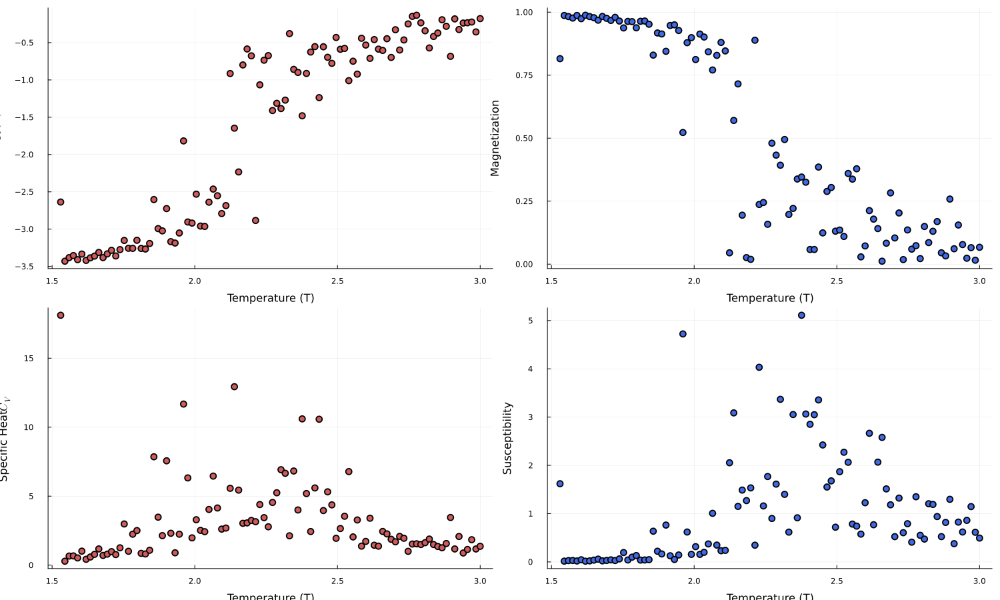

In [7]:
#f = plot(size=(900, 500))  # plot the calculated values
p1=scatter(T, E, markersize=5, markercolor=:IndianRed, xlabel="Temperature (T)", ylabel="Energy"*L"(E)", legend=false)
p2=scatter(T, abs.(M), markersize=5, markercolor=:RoyalBlue, xlabel="Temperature (T)", ylabel="Magnetization", legend=false)
p3=scatter(T, C, markersize=5, markercolor=:IndianRed, xlabel="Temperature (T)", ylabel="Specific Heat"*L"C_V", legend=false)
p4=scatter(T, χ, markersize=5, markercolor=:RoyalBlue, xlabel="Temperature (T)", ylabel="Susceptibility", legend=false)
plot(p1,p2,p3,p4, layout = (2,2) ,size=(1500,900))

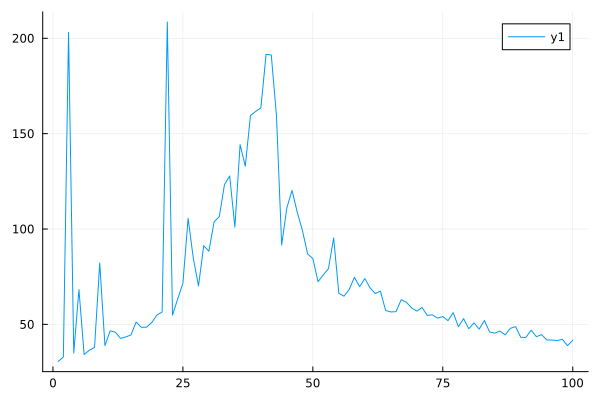

In [41]:
plot((std(ET,dims=1)[1,:])./T)

4.Obtén secuencias de estados para las temperaturas reducidas $1.8, 2.3$ y $3$, de un sistema con $32^2$  spins. Para cada uno de estos tres casos grafica la energía y la magnetización a lo largo de la secuencia. También dibuja estados típicos que se encuentren en cada una de las temperaturas. Observa y explica los diferentes comportamientos.

In [11]:
N = 64            # size of the lattice, N x N
eqSteps = N^2       # number of MC sweeps for equilibration
mcSteps = N^2      # number of MC sweeps for calculation #####Variar 
T = [1.8]

E,M,C,χ,DataT,xs,ET,MT=ising(N,T,mcSteps,eqSteps);

In [12]:
function EI(mcSteps,eqSteps,NR,T,N)####Funcion para repetri
    EN=zeros(mcSteps,NR)
    MN=zeros(mcSteps,NR)
    for i in range(1,NR)
        E,M,C,χ,DataT,xs,ET,MT=ising(N,T,mcSteps,eqSteps);
        EN[:,i]=ET
        MN[:,i]=MT
    end
    p1=plot(EN,title="Energia vs iteracion"*" "*"   Temperatura "*L"T="*string(T...),color="black",alpha=0.1,label="")
    p2=plot(MN,title="Magnetización vs iteracion"*" "*"   Temperatura "*L"T="*string(T...),color="black",alpha=0.1,label="")
    plot(p1,p2, layout = (1,2) ,size=(1500,500))
    #return EN,MN
end

EI (generic function with 1 method)

In [17]:
NR=100
N = 64  
eqSteps = N^2       # number of MC sweeps for equilibration
mcSteps = N^2  # number of MC sweeps for calculation #####Variar 

4096

# $T=1.8$

In [18]:
          # size of the lattice, N x N   
T = [1.8]
EI(mcSteps,eqSteps,NR,T,N)


# $T=2.3$

In [19]:
T=[2.3]
NR=100
EI(mcSteps,eqSteps,NR,T,N)

InterruptException: InterruptException:

# $T=3$

In [20]:
T=[3]
NR=100
EI(mcSteps,eqSteps,NR,T,N)

InterruptException: InterruptException:

## Correr varias veces el experimento

In [15]:
#Numero de Realizaciones
NR=100

100

In [27]:
nt = 100    # number of temperature points
N = 16            # size of the lattice, N x N
eqSteps = 32^2        # number of MC sweeps for equilibration
mcSteps = 32^2     # number of MC sweeps for calculation #####Variar 
T = range(1.7, stop=3, length=nt);
#E,M,C,χ,DataT,xs,ET,MT=ising(N,T,mcSteps,eqSteps);

In [28]:
Es=zeros(nt,NR) ##Matriz de Eneria vs temperatura 
Ms=zeros(nt,NR)
Cs=zeros(nt,NR)
Xs=zeros(nt,NR)
for i in range(1,NR)
    E,M,C,χ,DataT,xs=ising(N,T,mcSteps,eqSteps);
    Es[:,i]=E
    Ms[:,i]=M
    Cs[:,i]=C
    Xs[:,i]=χ
end

# Encontrar temperaura critica $T_c$

In [29]:
Cmean=mean(Cs,dims=2);
Cmax=maximum(Cmean); ## 
Tc=(T[(Cmean.==Cmax)[:,1]])[1]; ##Tempertura critica
#####Promedio Energia 
Emean=mean(Es,dims=2);
####Promedio de la Susceptibilidad
χmean=mean(Xs,dims=2);
###Promedio de Magnetizacion
Mmean=mean(Ms,dims=2);


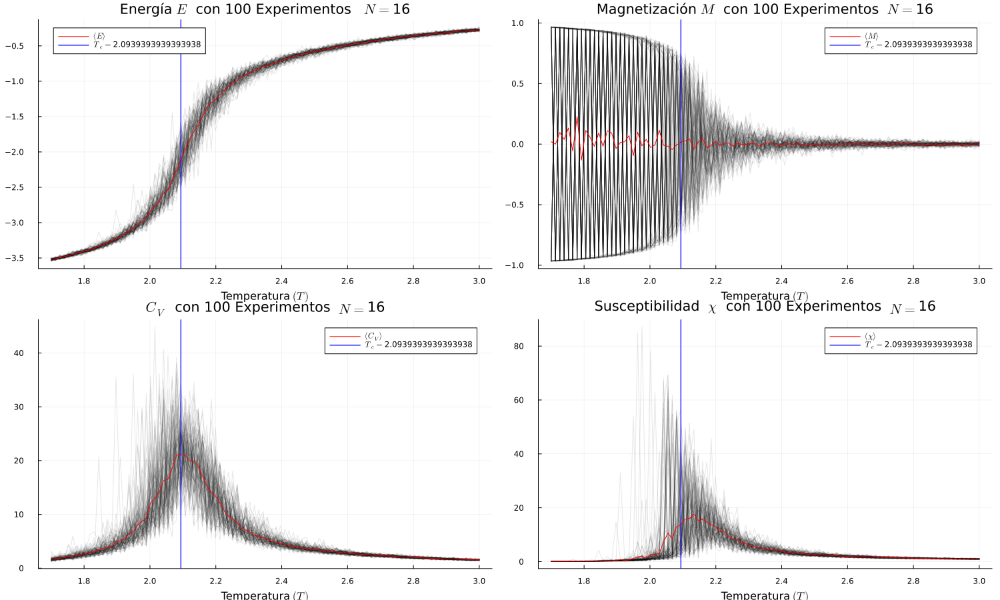

In [30]:
pp1=plot(T,Es,title="Energía "*L"E"*"  con "*string(NR)*" Experimentos"*"   "*L"N="*string(N),label="",color="black",alpha=0.1,xlabel="Temperatura "*L"(T)",ylabel="")
plot!(T,Emean,label=L"\langle E \rangle",color="red")
vline!([Tc],label=L"T_c="*string(Tc),color="blue",lw=1.3)


pp2=plot(T,Ms,title="Magnetización "*L" M"*"  con "*string(NR)*" Experimentos  "*L"N="*string(N),label="",color="black",alpha=0.1,xlabel="Temperatura "*L"(T)",ylabel="")
plot!(T,Mmean,label=L"\langle M \rangle",color="red")
vline!([Tc],label=L"T_c="*string(Tc),color="blue",lw=1.3)

pp3=plot(T,Cs,title=L"C_V"*"  con "*string(NR)*" Experimentos  "*L"N="*string(N),label="",color="black",alpha=0.1,xlabel="Temperatura "*L"(T)",ylabel="")
plot!(T,Cmean,label=L"\langle C_V \rangle",color="red")
vline!([Tc],label=L"T_c="*string(Tc),color="blue",lw=1.3)

pp4=plot(T,Xs,title="Susceptibilidad  "*L"\chi"*"  con "*string(NR)*" Experimentos  "*L"N="*string(N),label="",color="black",alpha=0.1,xlabel="Temperatura "*L"(T)",ylabel="")
plot!(T,χmean,label=L"\langle \chi \rangle",color="red")
vline!([Tc],label=L"T_c="*string(Tc),color="blue",lw=1.3)
plot(pp1,pp2,pp3,pp4, layout = (2,2) ,size=(1500,900))

In [25]:
nt = 2    # number of temperature points
N = 64          # size of the lattice, N x N
eqSteps = 1#024        # number of MC sweeps for equilibration
mcSteps = N^2     # number of MC sweeps for calculation #####Variar 
T = range(1.7, stop=3, length=nt);
E,M,C,χ,DataT,xs,ET,MT=ising(N,T,mcSteps,eqSteps);

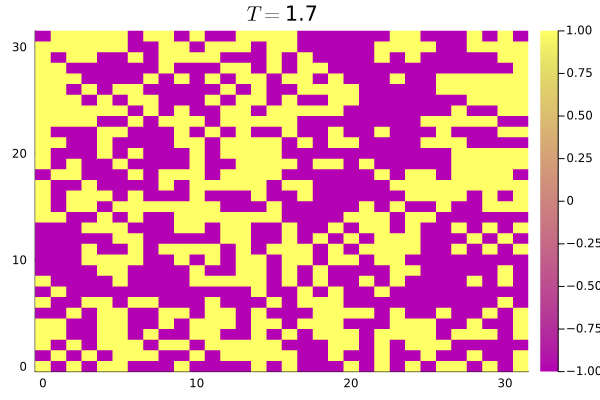

In [63]:
tt=2#mcSteps
heatmap(xs,xs,DataT[nt][:,:,end],title=L"T="*string(T[1]),color=:buda)

[ Info: Saved animation to C:\Users\Arif\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\Termodinamica\Modeloising.gif


Plots.AnimatedGif("C:\\Users\\Arif\\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\\Termodinamica\\Modeloising.gif")
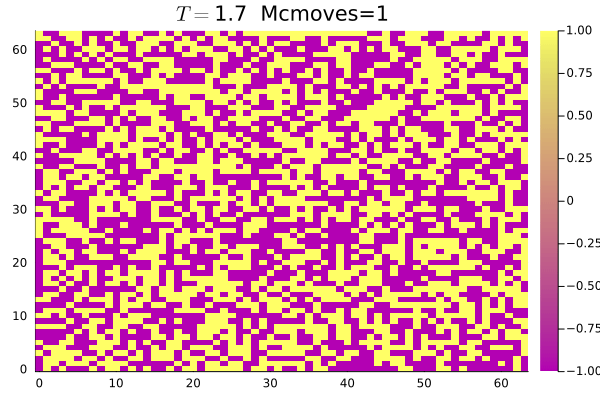

In [27]:
animac(xs,xs,DataT,1,"Modeloising")

In [16]:
function animac(xs,ys,zs,TT,tit)
    anim2d=@animate for i in 1:10:length(zs[TT][1,1,:]);
        heatmap(xs,ys,(zs[TT])[:,:,i],title=L"T="*string(T[TT])*"  Mcmoves="*string(i),color=:buda)
    end;
    gif(anim2d,tit*".gif",fps=24)
end


animac (generic function with 1 method)